<a href="https://colab.research.google.com/github/ZeynepRuveyda/classification_automi/blob/main/pytorch_cnn_binary_image_classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Import Libraries and load dataset

In [ ]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt
from plotly.subplots import make_subplots
import plotly.graph_objs as go
import seaborn as sns
from tqdm.notebook import tqdm
import copy
import os
import torch
from PIL import Image
from PIL import Image, ImageDraw
import torchvision
import torch.optim as optim
import torch.nn.functional as F
from torchvision import transforms, utils, datasets
from torch.utils.data import Dataset, DataLoader, random_split, SubsetRandomSampler, WeightedRandomSampler
from torch.utils.data import Dataset
import torchvision.transforms as transforms
from torch.utils.data import random_split
from torch.optim.lr_scheduler import ReduceLROnPlateau
import torch.nn as nn
from torchvision import utils
%matplotlib inline
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
import numpy as np
import torchvision
from torchvision import datasets, models, transforms
import matplotlib.pyplot as plt
import time
import os
import copy


In [ ]:

from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


In [ ]:
!pip install torchsummary

<div style="color:white;
       display:fill;
       border-radius:5px;
       background-color:#5D2ECC;
       font-size:220%;
       font-family:Nexa;
       letter-spacing:0.5px">
    <p style="padding: 20px;
          color:white;">
        <b>0|</b> Reading Csv Files
    </p>
</div>


In [ ]:
# Assuming `train_df` and `val_df` are already prepared DataFrames with image paths and labels.
x_train_df = pd.read_csv('/content/drive/MyDrive/data/X_train.csv')
y_train_df = pd.read_csv('/content/drive/MyDrive/data/Y_train.csv')

# Adjust image paths
x_train_df['image_path'] = '/content/drive/MyDrive/' + x_train_df['image_path']

# Combine image paths and labels into one dataframe
data_df = pd.concat([x_train_df['image_path'], y_train_df], axis=1)
data_df.to_csv('data_df.csv', index=False)


In [ ]:
data_df.head()

,image_path,output
0,/content/drive/MyDrive/data/images/train/949a5...,1
1,/content/drive/MyDrive/data/images/train/044d1...,1
2,/content/drive/MyDrive/data/images/train/738e1...,0
3,/content/drive/MyDrive/data/images/train/1e07b...,0
4,/content/drive/MyDrive/data/images/train/e96a4...,0


In [ ]:
data_df.tail()

,image_path,output
1034,/content/drive/MyDrive/data/images/train/6f3d0...,0
1035,/content/drive/MyDrive/data/images/train/f60ec...,1
1036,/content/drive/MyDrive/data/images/train/cc421...,0
1037,/content/drive/MyDrive/data/images/train/6e7d0...,1
1038,/content/drive/MyDrive/data/images/train/b0915...,0


#Image Processing

<div style="color:white;
       display:fill;
       border-radius:5px;
       background-color:#5D2ECC;
       font-size:220%;
       font-family:Nexa;
       letter-spacing:0.5px">
    <p style="padding: 20px;
          color:white;">
        <b>1 |</b> CREATING A CUSTOM DATASET
    </p>
</div>


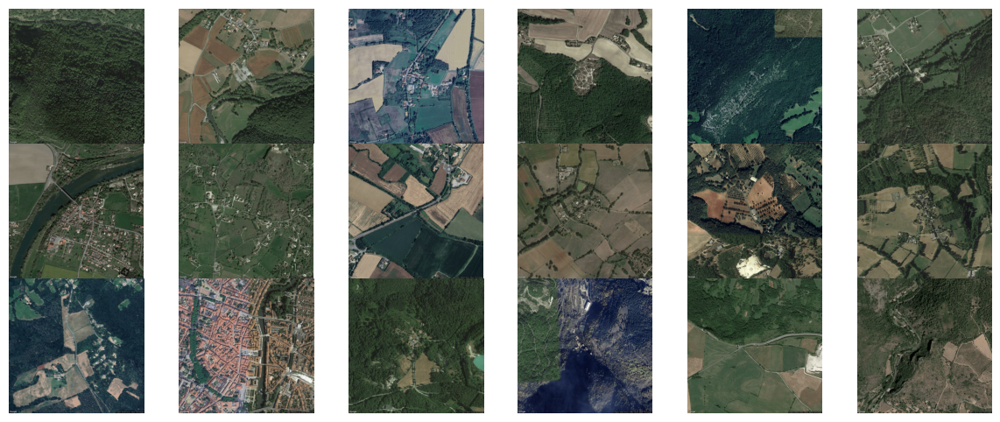

In [ ]:
# data is stored here
Not_Quarry = data_df.loc[data_df['output']==0]['image_path'].values
Quarry = data_df.loc[data_df['output']==1]['image_path'].values
nrows,ncols=3,6
fig,ax = plt.subplots(nrows,ncols,figsize=(15,6))
plt.subplots_adjust(wspace=0, hspace=0)
for i,image_path in enumerate(Not_Quarry[:nrows*ncols]):
    img = Image.open(image_path)
    idcol = ImageDraw.Draw(img)
    plt.subplot(nrows, ncols, i+1)
    plt.imshow(np.array(img))
    plt.axis('off')

<Figure size 1500x600 with 0 Axes>

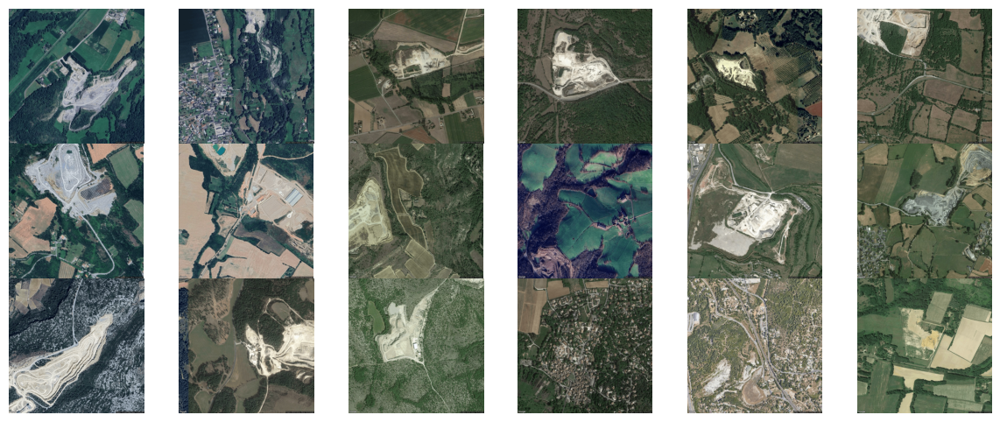

In [ ]:
plt.rcParams['figure.figsize'] = (15, 6)
plt.subplots_adjust(wspace=0, hspace=0)
nrows,ncols=3,6
fig,ax = plt.subplots(nrows,ncols,figsize=(15,6))
plt.subplots_adjust(wspace=0, hspace=0)
for i,image_path in enumerate(Quarry[:nrows*ncols]):
    img = Image.open(image_path)
    idcol = ImageDraw.Draw(img)
    plt.subplot(nrows, ncols, i+1)
    plt.imshow(np.array(img))
    plt.axis('off')

<div style="color:white;
       display:fill;
       border-radius:5px;
       background-color:#5D2ECC;
       font-size:220%;
       font-family:Nexa;
       letter-spacing:0.5px">
    <p style="padding: 20px;
          color:white;">
        <b>2 |</b> CREATING A CUSTOM DATASET
    </p>
</div>


In [36]:
# fix torch random seed
torch.manual_seed(0)

class pytorch_data(Dataset):

    def __init__(self, df,transform):

        # Get Image File Names

        self.full_filenames = df['image_path'].tolist()
        # Get Labels


        df.set_index("image_path", inplace=True) # set data frame index to id
        self.labels = df["output"].tolist() # obtain labels from df
        self.transform = transform

    def __len__(self):
        return len(self.full_filenames) # size of dataset

    def __getitem__(self, idx):
        # open image, apply transforms and return with label
        image = Image.open(self.full_filenames[idx])  # Open Image with PIL
        image = self.transform(image) # Apply Specific Transformation to Image
        return image, self.labels[idx]

In [ ]:
# define transformation that converts a PIL image into PyTorch tensors.
import torchvision.transforms as transforms
data_transformer = transforms.Compose([transforms.Resize(512),transforms.ToTensor()])

In [ ]:
data_df = pd.read_csv("/content/data_df.csv")
img_dataset = pytorch_data(data_df,data_transformer)

In [ ]:
# load an example tensor
img,label=img_dataset[10]
print(img.shape,torch.min(img),torch.max(img))

torch.Size([3, 512, 512]) tensor(0.0078) tensor(0.8745)


<div style="color:white;
       display:fill;
       border-radius:5px;
       background-color:#5D2ECC;
       font-size:220%;
       font-family:Nexa;
       letter-spacing:0.5px">
    <p style="padding: 20px;
          color:white;">
        <b>3 |</b> SPLITTING THE DATASET
    </p>
</div>



In [ ]:
len_img=len(img_dataset)
len_train = int(0.85*len_img)
len_val = len_img - len_train
train_ts,val_ts=random_split(img_dataset,[len_train,len_val])


# Split Pytorch tensor

image_datasets ={"train":train_ts , "val":val_ts}
for x in ['train', 'val']:
  dataset_sizes = {x: len(image_datasets[x]) for x in ['train', 'val']}
print("train dataset size:", len(train_ts))
print("validation dataset size:", len(val_ts))


train dataset size: 883
validation dataset size: 156


In [ ]:
# getting the torch tensor image & target variable
ii=-1
for x,y in train_ts:
    print(x.shape,y)
    ii+=1
    if(ii>5):
        break

torch.Size([3, 512, 512]) 0
torch.Size([3, 512, 512]) 0
torch.Size([3, 512, 512]) 1
torch.Size([3, 512, 512]) 1
torch.Size([3, 512, 512]) 0
torch.Size([3, 512, 512]) 0
torch.Size([3, 512, 512]) 1


In [ ]:
import plotly.express as px

def plot_img(x,y):

    npimg = x.numpy() # convert tensor to numpy array
    npimg_tr=np.transpose(npimg, (1,2,0)) # Convert to H*W*C shape
    fig = px.imshow(npimg_tr)
    fig.update_layout(coloraxis_showscale=False,title=str(y_grid_train))
    fig.update_xaxes(showticklabels=False)
    fig.update_layout(template='plotly_white',height=200);fig.update_layout(margin={"r":0,"t":60,"l":0,"b":0})
    fig.update_layout(title={'text': str(y),'y':0.9,'x':0.5,'xanchor': 'center','yanchor': 'top'})

    fig.show()

### Training Subset Examples
Some examples from our training data subset, with corresponding labels.

In [ ]:
import plotly.express as px

# Create grid of sample images (training subsample data)
grid_size=8
rnd_inds=np.random.randint(0,len(train_ts),grid_size)
print("image indices:",rnd_inds)

x_grid_train=[train_ts[i][0] for i in rnd_inds]
y_grid_train=[train_ts[i][1] for i in rnd_inds]

x_grid_train=utils.make_grid(x_grid_train, nrow=4, padding=2)
print(x_grid_train.shape)

plot_img(x_grid_train,y_grid_train)

image indices: [574 488 575 830 424 256 213 754]
torch.Size([3, 1030, 2058])


### Validation Dataset Examples
Some examples from the validation subset, with corresponding labels.

In [ ]:
grid_size=8
rnd_inds=np.random.randint(0,len(val_ts),grid_size)
print("image indices:",rnd_inds)
x_grid_val=[val_ts[i][0] for i in range(grid_size)]
y_grid_val=[val_ts[i][1] for i in range(grid_size)]

x_grid_val=utils.make_grid(x_grid_val, nrow=4, padding=2)
print(x_grid_val.shape)

plot_img(x_grid_val,y_grid_val)

image indices: [ 79 128  35 117 124 134 109  95]
torch.Size([3, 1030, 2058])


<div style="color:white;
       display:fill;
       border-radius:5px;
       background-color:#5D2ECC;
       font-size:220%;
       font-family:Nexa;
       letter-spacing:0.5px">
    <p style="padding: 20px;
          color:white;">
        <b>4 |</b> TRANSFORMING THE DATA
    </p>
</div>


In [ ]:
from torchvision.transforms.transforms import Resize
from numpy.core.fromnumeric import resize
# Augmentation
# Define the following transformations for the training dataset
tr_transf = transforms.Compose([

    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomVerticalFlip(p=0.5),
    transforms.RandomRotation(45),
    transforms.RandomResizedCrop(512,scale=(0.8,1.0),ratio=(1.0,1.0)),
    transforms.Normalize([0.5,0.5,0.5],[0.5,0.5,0.5]),
    transforms.ToTensor()])

In [ ]:
# no augmentation for validation and test transfer
val_transf = transforms.Compose([
    transforms.Normalize([0.5,0.5,0.5],[0.5,0.5,0.5]),
    transforms.ToTensor()])


In [ ]:
# After defining the transformations, overwrite the transform functions of train_ts, val_ts
train_ts.transform = tr_transf
val_ts.transform = val_transf


<div style="color:white;
       display:fill;
       border-radius:5px;
       background-color:#5D2ECC;
       font-size:220%;
       font-family:Nexa;
       letter-spacing:0.5px">
    <p style="padding: 20px;
          color:white;">
        <b>5 |</b> CREATING DATALOADERS
    </p>
</div>


In [ ]:
# Define two dataloaders for the datasets

from torch.utils.data import DataLoader
train_dl = DataLoader(train_ts, batch_size=64,shuffle=True)
val_dl = DataLoader(val_ts, batch_size=64, shuffle=False)


dataloaders  = {"train" : train_dl,"val" : val_dl}

In [ ]:
for x,y in train_dl:
    print(x.shape,y)
    break

In [ ]:
# Create device for using CPU
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

<div style="color:white;
       display:fill;
       border-radius:5px;
       background-color:#5D2ECC;
       font-size:220%;
       font-family:Nexa;
       letter-spacing:0.5px">
    <p style="padding: 20px;
          color:white;">
        <b>6 |</b> BUILDING A CLASSIFICATION MODEL
    </p>
</div>



In [ ]:
model_conv = torchvision.models.resnet18(pretrained=True)
#freezing last layer
for param in model_conv.parameters():
    param.requires_grad = False

# Parameters of newly constructed modules have requires_grad=True by default
num_ftrs = model_conv.fc.in_features
model_conv.fc = nn.Linear(num_ftrs, 2)

model_conv = model_conv.to(device)

criterion = nn.CrossEntropyLoss()

# Observe that only parameters of final layer are being optimized as
# opposed to before.
optimizer_conv = optim.SGD(model_conv.fc.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 7 epochs
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_conv, step_size=7, gamma=0.1)

In [ ]:
from torchsummary import summary
summary(model_conv, input_size=(3,512,512))

<div style="color:white;
       display:fill;
       border-radius:5px;
       background-color:#5D2ECC;
       font-size:220%;
       font-family:Nexa;
       letter-spacing:0.5px">
    <p style="padding: 20px;
          color:white;">
        <b>7 |</b> TRAINING
    </p>
</div>

In [ ]:
def train_model(model, criterion, optimizer, scheduler, num_epochs=25):
    since = time.time()
    loss_history={"train": [],"val": []} # history of loss values in each epoch
    metric_history={"train": [],"val": []} # histroy of metric values in each epoch
    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch, num_epochs - 1))
        print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0

            # Iterate over data.
            for inputs, labels in dataloaders[phase]:
                inputs = inputs.to(device)
                labels = labels.to(device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    loss = criterion(outputs, labels)

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
            if phase == 'train':
                scheduler.step()

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]

            print('{} Loss: {:.4f} Acc: {:.4f}'.format(
                phase, epoch_loss, epoch_acc))
            if phase == 'train':
              loss_history["train"].append(epoch_loss)
              metric_history["train"].append(epoch_acc)
            if phase == 'val':
              loss_history["val"].append(epoch_loss)
              metric_history["val"].append(epoch_acc)

            # deep copy the model
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = copy.deepcopy(model.state_dict())

        print()

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}'.format(best_acc))

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model,loss_history,metric_history



In [ ]:
num_epochs = 50
model_conv,loss_history,metric_history = train_model(model_conv, criterion, optimizer_conv,
                         exp_lr_scheduler, num_epochs=num_epochs)
# Save the model

torch.save(model_conv, '/content/drive/MyDrive/data/images/saved_model.pth')


<div style="color:white;
       display:fill;
       border-radius:5px;
       background-color:#5D2ECC;
       font-size:220%;
       font-family:Nexa;
       letter-spacing:0.5px">
    <p style="padding: 20px;
          color:white;">
        <b>8 |</b> EVALUATION
    </p>
</div>

In [30]:
from sklearn.metrics import f1_score

epochs= num_epochs

fig = make_subplots(rows=1, cols=1,subplot_titles=['lost_history','metric_history'])
fig.add_trace(go.Scatter(x=[*range(1,epochs+1)], y=loss_history["train"],name='loss_history["train"]'),row=1, col=1)
fig.add_trace(go.Scatter(x=[*range(1,epochs+1)], y=loss_history["val"],name='loss_history["val"]'),row=1, col=1)
fig.update_layout(template='plotly_white');fig.update_layout(margin={"r":0,"t":60,"l":0,"b":0},height=300)
fig.show()


def evaluate_model_f1(model):
    model.eval()  # Set model to evaluation mode
    all_preds = []
    all_labels = []

    with torch.no_grad():
        for inputs, labels in dataloaders['val']:
            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    # Calculate F1 Score
    f1 = f1_score(all_labels, all_preds, average='binary')
    print(f'F1 Score: {f1:.4f}')
    return f1

# Call this function after training or during evaluation
f1_score_result = evaluate_model_f1(model_conv)


F1 Score: 0.8072


<div style="color:white;
       display:fill;
       border-radius:5px;
       background-color:#5D2ECC;
       font-size:220%;
       font-family:Nexa;
       letter-spacing:0.5px">
    <p style="padding: 20px;
          color:white;">
        <b>9 |</b> SAMPLE TEST VISUALISATION
    </p>
</div>

In [31]:
def imshow(inp, title=None):
    """Imshow for Tensor."""
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.5, 0.5, 0.5])
    std = np.array([0.5, 0.5, 0.5])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    plt.imshow(inp)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)

In [32]:
def visualize_model(model, num_images=6):
    was_training = model.training
    model.eval()
    images_so_far = 0
    fig = plt.figure()

    with torch.no_grad():
        for i, (inputs, labels) in enumerate(dataloaders['val']):
            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            for j in range(inputs.size()[0]):
                images_so_far += 1
                ax = plt.subplot(num_images // 2, 2, images_so_far)
                ax.axis('off')
                ax.set_title(f'predicted: {preds[j].item()} | true: {labels[j].item()}')
                imshow(inputs.cpu().data[j])

                if images_so_far == num_images:
                    model.train(mode=was_training)
                    return
        model.train(mode=was_training)


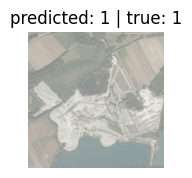

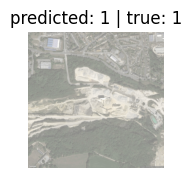

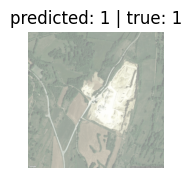

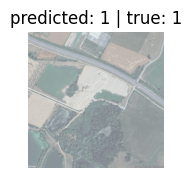

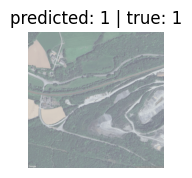

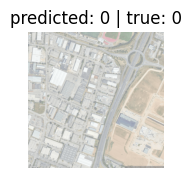

In [33]:
visualize_model(model_conv)

plt.ioff()
plt.show()

<div style="color:white;
       display:fill;
       border-radius:5px;
       background-color:#5D2ECC;
       font-size:220%;
       font-family:Nexa;
       letter-spacing:0.5px">
    <p style="padding: 20px;
          color:white;">
        <b>10 |</b> TEST
    </p>
</div>

In [38]:
def generate_y_test(model, csv_file, output_csv='Y_test_CV.csv'):
    # Use the existing pytorch_data class to create the dataset
    test_dataset = pytorch_data(csv_file,data_transformer)
    # Create DataLoader for the test dataset
    test_loader = DataLoader(test_dataset, batch_size=64, shuffle=False)
    # Set the model to evaluation mode
    model.eval()
    predictions = []

    with torch.no_grad():
        for inputs, image_paths in test_loader:
            inputs = inputs.to(device)
            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            # Store predictions
            for pred in preds.cpu().numpy():
                predictions.append({'output': int(pred)})

    # Convert to DataFrame and save to CSV
    y_test_df = pd.DataFrame(predictions)
    y_test_df.to_csv(output_csv, index=False)
    print(f'Predictions saved to {output_csv}')


x_test_df = pd.read_csv('/content/drive/MyDrive/data/X_test.csv')
# Adjust image paths
x_test_df['image_path'] = '/content/drive/MyDrive/' + x_test_df['image_path']
y_test_none = pd.DataFrame({'output': [None] * 525})
# Combine image paths and labels into one dataframe
data_df_test = pd.concat([x_test_df['image_path'], y_test_none], axis=1)
data_df_test.to_csv('data_df_test.csv', index=False)
data_df_test = pd.read_csv("/content/data_df_test.csv")
generate_y_test(model_conv,data_df_test )

Predictions saved to y_test_CV.csv
